<a href="https://colab.research.google.com/github/Hugues7/30Days_NLP/blob/main/Projet_PFE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd


In [ ]:
import pandas as pd
import glob

# #Trouver tous les fichiers CSV dans le dossier
# fichiers_csv = glob.glob("*.csv")  # Changez le chemin si nécessaire

# # Fusionner tous les fichiers CSV en un DataFrame
# dataframes = [pd.read_csv(fichier) for fichier in fichiers_csv]
# fusion_csv = pd.concat(dataframes, ignore_index=True)

# # Sauvegarder le fichier fusionné
# fusion_csv.to_csv("datatourism.csv", index=False)


In [ ]:
df=pd.read_csv('datatourism.csv')

<ipython-input-12-e913c6e92806>:1: DtypeWarning: Columns (3,11,14,16) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('datatourism.csv')


In [ ]:
df.head()

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Code_postal_et_commune,Covid19_mesures_specifiques,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,Contacts_du_POI,Classements_du_POI,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,code_postal,Nbre_visite
0,LA VOIE VERTE DES HAUTES-VOSGES,https://www.datatourisme.fr/ontology/core#Poin...,48.013371,6.604253,à proximité du Plan d'eau Rue du Lit d'eau,88200#Remiremont,NaN,OT REMIREMONT,Système d’information touristique Lorrain,2023-12-26,#https://www.paysderemiremont.fr/voieverte/,Voie verte#Voie verte,"Entourée de montagnes et d’air pur, la Voie Ve...",https://data.datatourisme.fr/10/08583585-fc0a-...,88200,Remiremont,88,Vosges,88200.0,700.0
1,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,Nièvre Attractive,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,#http://www.velotouktouk.com/fr/<>https://www....,Accueil Vélo#France Vélo Tourisme,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0
2,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,ADT58,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,#http://www.velotouktouk.com/fr/<>https://www....,Accueil Vélo#France Vélo Tourisme,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0
3,Boutique Les Copains d'Thiérache : Location de...,https://www.datatourisme.fr/ontology/core#Plac...,49.898652,3.624899,24 rue Camille Desmoulins,02120#Guise,NaN,SIM Hauts-de-France - OT du Pays de Thiérache,SIM Hauts-de-France,2024-09-19,#,Accueil Vélo#France Vélo Tourisme,"A la boutique ""Les Copains de Thiérache "" de G...",https://data.datatourisme.fr/28/484e0b87-c232-...,2120,Guise,NaN,NaN,NaN,130.0
4,BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE,https://www.datatourisme.fr/ontology/core#Poin...,48.024938,6.959529,Route de Vologne Parking de Blanchemer,88250#La Bresse,NaN,OT COMMUNAUTAIRE DE LA BRESSE HAUTES VOSGES,Système d’information touristique Lorrain,2024-07-30,#https://www.labresse.net/,Famille plus#Famille plus,Découvrez un lac d'origine glaciaire endigué e...,https://data.datatourisme.fr/10/ecfd2352-eb27-...,88250,La Bresse,88,Vosges,88250.0,928.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440788 entries, 0 to 440787
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Nom_du_POI                   440788 non-null  object 
 1   Categories_de_POI            440786 non-null  object 
 2   Latitude                     440779 non-null  float64
 3   Longitude                    440782 non-null  object 
 4   Adresse_postale              395379 non-null  object 
 5   Code_postal_et_commune       440781 non-null  object 
 6   Covid19_mesures_specifiques  8186 non-null    object 
 7   Createur_de_la_donnee        440778 non-null  object 
 8   SIT_diffuseur                440781 non-null  object 
 9   Date_de_mise_a_jour          440781 non-null  object 
 10  Contacts_du_POI              423533 non-null  object 
 11  Classements_du_POI           83286 non-null   object 
 12  Description                  271276 non-null  object 
 13 

In [ ]:
# prompt: supprimer dans la colonne Keywords :PlaceOfInterest, PointOfInterest,

import pandas as pd
import glob

# ... (your existing code) ...
df1 = pd.DataFrame()
def extract_keywords(categories_string):
    if pd.isna(categories_string):  # Handle missing values
        return []
    Keywords = []
    for category in categories_string.split('|'):
        parts = category.split('#')
        if len(parts) > 1:
            keyword = parts[1]
            if keyword not in ["PlaceOfInterest", "PointOfInterest"]:
                Keywords.append(keyword)
        else:
            parts = category.split('/')
            if len(parts) > 3 :
                keyword = parts[3]
                if keyword not in ["PlaceOfInterest", "PointOfInterest"]:
                    Keywords.append(keyword)
    return Keywords

# Apply the function to create the 'Keywords' column
df1['Keywords'] = df['Categories_de_POI'].apply(extract_keywords)
df1['Categories_de_POI'] = df['Categories_de_POI']
print(df1[['Categories_de_POI', 'Keywords']].head())

                                   Categories_de_POI  \
0  https://www.datatourisme.fr/ontology/core#Poin...   
1  https://www.datatourisme.fr/ontology/core#Plac...   
2  https://www.datatourisme.fr/ontology/core#Plac...   
3  https://www.datatourisme.fr/ontology/core#Plac...   
4  https://www.datatourisme.fr/ontology/core#Poin...   

                                            Keywords  
0      [CyclingTour, Tour, WalkingTour, OrderedList]  
1  [Product, SportsAndLeisurePlace, ActivityProvi...  
2  [Product, SportsAndLeisurePlace, ActivityProvi...  
3  [Product, SportsAndLeisurePlace, EquipmentRent...  
4                   [Tour, WalkingTour, OrderedList]  


In [ ]:
df1['Keywords'][5543]

['SportsAndLeisurePlace',
 'Tour',
 'WalkingTour',
 'EducationalTrail',
 'OrderedList']

In [ ]:
import pandas as pd



# Dictionnaire pour classer les mots-clés dans des thématiques
keywords_mapping = {
    "Hébergement": ["Accommodation", "RentalAccommodation", "SelfCateringAccommodation", "LodgingBusiness", "House"],
    "Culture et Histoire": ["ArcheologicalSite", "CulturalSite", "CityHeritage", "Ruins", "DefenceSite", "FortifiedSet","Library","InterpretationCentre","Museum","ParkAndGarden"],
    "Patrimoine": ["TechnicalHeritage", "Farm", "Forge", "CoveredMarket", "Stables", "Pier", "WashHouse", "Mine", "Lighthouse", "PigeonLoft","Orchard"],
    "Gastronomie": ["FoodEstablishment","BistroOrWineBar","Cellar", "IceCreamShop","FastFoodRestaurant", "Restaurant", "BarOrPub", "Bakery", "CafeOrTeahouse", "GourmetRestaurant"],
    "Commerce": ["Shopping", "Store", "Mall", "AntiqueAndSecondhandGoodDealer", "CraftsmanShop", "BoutiqueOrLocalShop", "ShoppingCentreAndGallery", "ArtGalleryOrExhibitionGallery", "DepartmentStore", "HypermarketAndSupermarket", "LocalProductsShop"],
    "Sport": ["SportsAndLeisurePlace", "NauticalCentre", "BowlingAlley", "BoulesPitch", "FitnessCenter", "EquestrianCenter", "RacingCircuit", "DownhillSkiResort", "CrossCountrySkiResort","FrontonBelotaCourt","Racetrack","IceSkatingRink","SwimmingPool","TrackRollerOrSkateBoard","DownhillSkiRun","CrossCountrySkiTrail"],
    "Loisirs":["PlayArea","Auditorium","SightseeingBoat","Casino","BalneotherapyCentre","Cinema","Cinematheque","CircusPlace","BeachClub","KidsClub","LeisureComplex","NightClub","ThemePark","BilliardRoom","MultiPurposeRoomOrCommunityRoom","Theater","TouristTrain","VivariumAquarium","RailBike","ZooAnimalPark"],
    "Site naturel":["NaturalHeritage","AlpinePasture","Bocage","Canal","Canyon","Waterfall","Causse","tubbleFields","Col","Crest","Guesta","ConeNeck","Coastline","Hillsides","Dune","Pond","Cliff","Forest","Glacier","Gorge","CaveSinkholeOrAven","Lake","Landes","Swamp","Mountain","NaturalPark","Beach","Stone","Plateau","Grassland","River","Stream","Summit","Bog","Valley","Volcano","HalophilicArea"],
    "Itineraire Touristiques": ["Tour", "CyclingTour", "FluvialTour", "WalkingTour", "RoadTour", "HorseTour"],







    # Ajoutez d'autres thématiques et mots-clés si nécessaire
}

# Fonction pour extraire thématique, mot-clé principal et secondaires
def classify_keywords(keywords):
    thématique = "Inconnue"
    mot_cle_principal = "Inconnu"
    mots_cles_secondaires = []

    for theme, mots_cles in keywords_mapping.items():
        matching_keywords = [kw for kw in keywords if kw in mots_cles]
        if matching_keywords:
            thématique = theme
            mot_cle_principal = matching_keywords[0]  # Le premier mot-clé correspondant devient le principal
            mots_cles_secondaires = matching_keywords[1:]  # Le reste devient secondaire
            break

    return thématique, mot_cle_principal, ", ".join(mots_cles_secondaires)

# Nettoyage des mots-clés et application de la fonction
def process_keywords(row):
    raw_keywords = str(row).replace("'", "").replace(" ", "").split(",")
    return classify_keywords(raw_keywords)

# Application à la colonne Keywords
df1[["Thématique", "Mot_cle_principal", "Mots_cles_secondaires"]] = df1["Keywords"].apply(
    lambda x: pd.Series(process_keywords(x))
)

# # Sauvegarder le résultat dans un nouveau fichier CSV
# output_file_path = "chemin/vers/fichier_sortie.csv"  # Remplacez par votre chemin
# df1.to_csv(output_file_path, index=False)

#print("Extraction terminée. Les résultats sont enregistrés dans :", output_file_path)


In [ ]:
df1

,Keywords,Categories_de_POI,Thématique,Mot_cle_principal,Mots_cles_secondaires
0,"[CyclingTour, Tour, WalkingTour, OrderedList]",https://www.datatourisme.fr/ontology/core#Poin...,Itineraire Touristiques,Tour,WalkingTour
1,"[Product, SportsAndLeisurePlace, ActivityProvi...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,
2,"[Product, SportsAndLeisurePlace, ActivityProvi...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,
3,"[Product, SportsAndLeisurePlace, EquipmentRent...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,
4,"[Tour, WalkingTour, OrderedList]",https://www.datatourisme.fr/ontology/core#Poin...,Itineraire Touristiques,WalkingTour,
...,...,...,...,...,...
440783,"[CulturalSite, RemarkableBuilding, RemarkableH...",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,
440784,"[CulturalSite, ReligiousSite, Chapel]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,
440785,"[CulturalSite, ReligiousSite, Church]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,
440786,"[CulturalSite, ReligiousSite, Church]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,


In [ ]:
(df1["Mots_cles_secondaires"]=="WalkingTour").value_counts()

,count
Mots_cles_secondaires,
False,434716
True,6072


In [ ]:
(df1["Mots_cles_secondaires"]=="RoadTour").value_counts()

,count
Mots_cles_secondaires,
False,440041
True,747


In [ ]:
df1['Thématique'].value_counts()

,count
Thématique,
Inconnue,145532
Hébergement,128934
Gastronomie,43570
Commerce,36698
Itineraire Touristiques,31381
Sport,24880
Culture et Histoire,17213
Loisirs,6079
Site naturel,4685


In [ ]:
df1['Thématique'].value_counts()

,count
Thématique,
Inconnue,145532
Hébergement,128934
Gastronomie,43570
Commerce,36698
Itineraire Touristiques,31381
Sport,24880
Culture et Histoire,17213
Loisirs,6079
Site naturel,4685


In [ ]:
# prompt: traduire en langaue francaise la colonne Mot_cle_principal

import pandas as pd
import glob

# ... (your existing code) ...

# Fonction pour traduire "Mot_cle_principal" en français
def translate_keyword(keyword):
    translations = {
        "Accommodation": "Hébergement",
        "RentalAccommodation": "Location de vacances",
        "SelfCateringAccommodation": "Hébergement indépendant",
        "LodgingBusiness": "Hébergement touristique",
        "House": "Maison",
        "ArcheologicalSite": "Site archéologique",
        "CulturalSite": "Site culturel",
        "CityHeritage": "Patrimoine urbain",
        "Ruins": "Ruines",
        "DefenceSite": "Site de défense",
        "FortifiedSet": "Ensemble fortifié",
        "Library": "Bibliothèque",
        "InterpretationCentre": "Centre d'interprétation",
        "Museum": "Musée",
        "ParkAndGarden": "Parc et jardin",
        "TechnicalHeritage": "Patrimoine technique",
        "Farm": "Ferme",
        "Forge": "Forge",
        "CoveredMarket": "Marché couvert",
        "Stables": "Écuries",
        "Pier": "Quai",
        "WashHouse": "Lavoir",
        "Mine": "Mine",
        "Lighthouse": "Phare",
        "PigeonLoft": "Pigeonnier",
        "Orchard": "Verger",
        "FoodEstablishment": "Établissement alimentaire",
        "BistroOrWineBar": "Bistro ou bar à vin",
        "Cellar": "Cave",
        "IceCreamShop": "Glacier",
        "FastFoodRestaurant": "Restaurant de restauration rapide",
        "Restaurant": "Restaurant",
        "BarOrPub": "Bar ou pub",
        "Bakery": "Boulangerie",
        "CafeOrTeahouse": "Café ou salon de thé",
        "GourmetRestaurant": "Restaurant gastronomique",
        "Shopping": "Shopping",
        "Store": "Magasin",
        "Mall": "Centre commercial",
        "AntiqueAndSecondhandGoodDealer": "Antiquaire et brocanteur",
        "CraftsmanShop": "Boutique d'artisan",
        "BoutiqueOrLocalShop": "Boutique ou magasin local",
        "ShoppingCentreAndGallery": "Centre commercial et galerie",
        "ArtGalleryOrExhibitionGallery": "Galerie d'art ou d'exposition",
        "DepartmentStore": "Grand magasin",
        "HypermarketAndSupermarket": "Hypermarché et supermarché",
        "LocalProductsShop": "Boutique de produits locaux",
        "SportsAndLeisurePlace": "Lieu de sport et de loisirs",
        "NauticalCentre": "Centre nautique",
        "BowlingAlley": "Bowling",
        "BoulesPitch": "Terrain de boules",
        "FitnessCenter": "Centre de remise en forme",
        "EquestrianCenter": "Centre équestre",
        "RacingCircuit": "Circuit de course",
        "DownhillSkiResort": "Station de ski alpin",
        "CrossCountrySkiResort": "Station de ski de fond",
        "FrontonBelotaCourt": "Fronton de pelote basque",
        "Racetrack": "Hippodrome",
        "IceSkatingRink": "Patinoire",
        "SwimmingPool": "Piscine",
        "TrackRollerOrSkateBoard": "Piste de roller ou de skateboard",
        "DownhillSkiRun": "Piste de ski alpin",
        "CrossCountrySkiTrail": "Piste de ski de fond",
        "PlayArea": "Aire de jeux",
        "Auditorium": "Auditorium",
        "SightseeingBoat": "Bateau promenade",
        "Casino": "Casino",
        "BalneotherapyCentre": "Centre de balnéothérapie",
        "Cinema": "Cinéma",
        "Cinematheque": "Cinémathèque",
        "CircusPlace": "Cirque",
        "BeachClub": "Club de plage",
        "KidsClub": "Club enfants",
        "LeisureComplex": "Complexe de loisirs",
        "NightClub": "Discothèque",
        "ThemePark": "Parc à thème",
        "BilliardRoom": "Salle de billard",
        "MultiPurposeRoomOrCommunityRoom": "Salle polyvalente ou salle des fêtes",
        "Theater": "Théâtre",
        "TouristTrain": "Train touristique",
        "VivariumAquarium": "Vivarium - Aquarium",
        "RailBike": "Vélorail",
        "ZooAnimalPark": "Zoo ou parc animalier",
        "NaturalHeritage": "Patrimoine naturel",
        "AlpinePasture": "Alpage",
        "Bocage": "Bocage",
        "Canal": "Canal",
        "Canyon": "Canyon",
        "Waterfall": "Cascade",
        "Causse": "Causse",
        "TubbleFields": "Chaumes",
        "Col": "Col",
        "Crest": "Crête",
        "Guesta": "Cuesta",
        "ConeNeck": "Cône",
        "Coastline": "Côte, littoral",
        "Hillsides": "Coteaux",
        "Dune": "Dune",
        "Pond": "Étang",
        "Cliff": "Falaise",
        "Forest": "Forêt",
        "Glacier": "Glacier",
        "Gorge": "Gorge",
        "CaveSinkholeOrAven": "Grotte, gouffre ou aven",
        "Lake": "Lac",
        "Landes": "Landes",
        "Swamp": "Marais",
        "Mountain": "Montagne",
        "NaturalPark": "Parc naturel",
        "Beach": "Plage",
        "Stone": "Pierre, rocher",
        "Plateau": "Plateau",
        "Grassland": "Prairie",
        "River": "Rivière",
        "Stream": "Ruisseau",
        "Summit": "Sommet",
        "Bog": "Tourbière",
        "Valley": "Vallée",
        "Volcano": "Volcan",
        "HalophilicArea": "Zone halophile",
        "Tour": "Circuit",
        "CyclingTour": "Itinéraire cyclable ",
        "FluvialTour": ", Itinéraire fluvial ou maritime",
        "WalkingTour": "Itinéraire pédestre",
        "RoadTour": " Itinéraire routier",
        "HorseTour": " Itinéraire équestre",
        "Inconnu": "Inconnu"  # Gestion des cas inconnus
    }
    return translations.get(keyword, keyword) # Retourne la traduction si elle existe, sinon le mot-clé original

# Appliquer la fonction de traduction à la colonne "Mot_cle_principal"
df1["Mot_cle_principal_fr"] = df1["Mot_cle_principal"].apply(translate_keyword)

# Afficher le DataFrame avec la nouvelle colonne
df1

,Keywords,Categories_de_POI,Thématique,Mot_cle_principal,Mots_cles_secondaires,Mot_cle_principal_fr
0,"[CyclingTour, Tour, WalkingTour, OrderedList]",https://www.datatourisme.fr/ontology/core#Poin...,Itineraire Touristiques,Tour,WalkingTour,Circuit
1,"[Product, SportsAndLeisurePlace, ActivityProvi...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,,Lieu de sport et de loisirs
2,"[Product, SportsAndLeisurePlace, ActivityProvi...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,,Lieu de sport et de loisirs
3,"[Product, SportsAndLeisurePlace, EquipmentRent...",https://www.datatourisme.fr/ontology/core#Plac...,Sport,SportsAndLeisurePlace,,Lieu de sport et de loisirs
4,"[Tour, WalkingTour, OrderedList]",https://www.datatourisme.fr/ontology/core#Poin...,Itineraire Touristiques,WalkingTour,,Itinéraire pédestre
...,...,...,...,...,...,...
440783,"[CulturalSite, RemarkableBuilding, RemarkableH...",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,,Inconnu
440784,"[CulturalSite, ReligiousSite, Chapel]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,,Inconnu
440785,"[CulturalSite, ReligiousSite, Church]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,,Inconnu
440786,"[CulturalSite, ReligiousSite, Church]",https://www.datatourisme.fr/ontology/core#Cult...,Inconnue,Inconnu,,Inconnu


In [ ]:
# prompt: : ajouter dans le dataframe df = pd.read_csv("/content/datatourism.csv") les colonnes Thématique et Mot_cle_principal_fr du dataframe df1  et respectivement sous les noms: Thematique_POI et Mot_cle_POI

# Add 'Thématique' and 'Mot_cle_principal_fr' columns to df
df = pd.merge(df, df1[['Thématique', 'Mot_cle_principal_fr']], left_index=True, right_index=True, how='left')

# Rename the added columns
df.rename(columns={'Thématique': 'Thematique_POI', 'Mot_cle_principal_fr': 'Mot_cle_POI'}, inplace=True)

df.head()

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Code_postal_et_commune,Covid19_mesures_specifiques,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,...,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,code_postal,Nbre_visite,Thematique_POI,Mot_cle_POI
0,LA VOIE VERTE DES HAUTES-VOSGES,https://www.datatourisme.fr/ontology/core#Poin...,48.013371,6.604253,à proximité du Plan d'eau Rue du Lit d'eau,88200#Remiremont,NaN,OT REMIREMONT,Système d’information touristique Lorrain,2023-12-26,...,"Entourée de montagnes et d’air pur, la Voie Ve...",https://data.datatourisme.fr/10/08583585-fc0a-...,88200,Remiremont,88,Vosges,88200.0,700.0,Itineraire Touristiques,Circuit
1,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,Nièvre Attractive,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
2,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,ADT58,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
3,Boutique Les Copains d'Thiérache : Location de...,https://www.datatourisme.fr/ontology/core#Plac...,49.898652,3.624899,24 rue Camille Desmoulins,02120#Guise,NaN,SIM Hauts-de-France - OT du Pays de Thiérache,SIM Hauts-de-France,2024-09-19,...,"A la boutique ""Les Copains de Thiérache "" de G...",https://data.datatourisme.fr/28/484e0b87-c232-...,2120,Guise,NaN,NaN,NaN,130.0,Sport,Lieu de sport et de loisirs
4,BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE,https://www.datatourisme.fr/ontology/core#Poin...,48.024938,6.959529,Route de Vologne Parking de Blanchemer,88250#La Bresse,NaN,OT COMMUNAUTAIRE DE LA BRESSE HAUTES VOSGES,Système d’information touristique Lorrain,2024-07-30,...,Découvrez un lac d'origine glaciaire endigué e...,https://data.datatourisme.fr/10/ecfd2352-eb27-...,88250,La Bresse,88,Vosges,88250.0,928.0,Itineraire Touristiques,Itinéraire pédestre


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440788 entries, 0 to 440787
Data columns (total 22 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Nom_du_POI                   440788 non-null  object 
 1   Categories_de_POI            440786 non-null  object 
 2   Latitude                     440779 non-null  float64
 3   Longitude                    440782 non-null  object 
 4   Adresse_postale              395379 non-null  object 
 5   Code_postal_et_commune       440781 non-null  object 
 6   Covid19_mesures_specifiques  8186 non-null    object 
 7   Createur_de_la_donnee        440778 non-null  object 
 8   SIT_diffuseur                440781 non-null  object 
 9   Date_de_mise_a_jour          440781 non-null  object 
 10  Contacts_du_POI              423533 non-null  object 
 11  Classements_du_POI           83286 non-null   object 
 12  Description                  271276 non-null  object 
 13 

In [ ]:
# prompt: lister toutes lignes ayant pour champ inconnu

# Display rows where the 'Thématique' column is equal to "Inconnue"
unknown_theme_rows = df[df['Thematique_POI'] == "Inconnue"]
unknown_theme_rows

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Code_postal_et_commune,Covid19_mesures_specifiques,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,...,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,code_postal,Nbre_visite,Thematique_POI,Mot_cle_POI
67,Balade à Roulettes n° 34 Le chemin des Hautes ...,https://www.datatourisme.fr/ontology/core#Poin...,43.449351,-0.112039,Place du Marcadieu,64350#Lembeye,NaN,OT Nord Béarn,SIRTAQUI Nouvelle-Aquitaine,2024-10-02,...,"Lembeye, « qui suscite l’envie », comme l’indi...",https://data.datatourisme.fr/23/094f5b34-1ae5-...,64350,Lembeye,64,Pyrénées-Atlantiques,64350.0,4628.0,Inconnue,Inconnu
68,Balade à Roulettes n° 34 Le chemin des Hautes ...,https://www.datatourisme.fr/ontology/core#Poin...,43.449351,-0.112039,Place du Marcadieu,64350#Lembeye,NaN,OT COTEAUX BEARN MADIRAN,SIRTAQUI Nouvelle-Aquitaine,2024-10-02,...,"Lembeye, « qui suscite l’envie », comme l’indi...",https://data.datatourisme.fr/23/094f5b34-1ae5-...,64350,Lembeye,64,Pyrénées-Atlantiques,64350.0,4628.0,Inconnue,Inconnu
69,Balade à Roulettes n° 34 Le chemin des Hautes ...,https://www.datatourisme.fr/ontology/core#Poin...,43.449351,-0.112039,Place du Marcadieu,64350#Lembeye,NaN,Syndicat du tourisme Coteaux Béarn Madiran,SIRTAQUI Nouvelle-Aquitaine,2024-10-02,...,"Lembeye, « qui suscite l’envie », comme l’indi...",https://data.datatourisme.fr/23/094f5b34-1ae5-...,64350,Lembeye,64,Pyrénées-Atlantiques,64350.0,4628.0,Inconnue,Inconnu
70,Balade à Roulettes n° 34 Le chemin des Hautes ...,https://www.datatourisme.fr/ontology/core#Poin...,43.449351,-0.112039,Place du Marcadieu,64350#Lembeye,NaN,OT Coteaux Béarn Madiran,SIRTAQUI Nouvelle-Aquitaine,2024-10-02,...,"Lembeye, « qui suscite l’envie », comme l’indi...",https://data.datatourisme.fr/23/094f5b34-1ae5-...,64350,Lembeye,64,Pyrénées-Atlantiques,64350.0,4628.0,Inconnue,Inconnu
97,LE SENTIER SOUS-MARIN,https://www.datatourisme.fr/ontology/core#Poin...,43.274960,3.511982,Rue de l'Estacade La Plagette - Vieux port,34300#Agde,NaN,OT CAP D'AGDE MEDITERRANEE,Hérault Tourisme,2024-12-01,...,"Ce parcours permet de découvrir faune, flore e...",https://data.datatourisme.fr/32/34bf3cd1-1285-...,34300,Agde,34,Hérault,34300.0,1836.0,Inconnue,Inconnu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440783,MAIRIE DE VOUECOURT,https://www.datatourisme.fr/ontology/core#Cult...,48.267275,5.137122,NaN,52320#Vouécourt,NaN,ADT de la Haute Marne,ADT de la Haute Marne,2024-09-17,...,NaN,https://data.datatourisme.fr/48/e54ae951-43cf-...,52320,Vouécourt,52.0,Haute-Marne,52320.0,252.0,Inconnue,Inconnu
440784,CHAPELLE SAINT-HILAIRE DE VOUECOURT,https://www.datatourisme.fr/ontology/core#Cult...,48.262076,5.124805,NaN,52320#Vouécourt,NaN,ADT de la Haute Marne,ADT de la Haute Marne,2024-09-17,...,NaN,https://data.datatourisme.fr/48/bdac95d0-73c0-...,52320,Vouécourt,52.0,Haute-Marne,52320.0,252.0,Inconnue,Inconnu
440785,ÉGLISE SAINT-PIERRE-ES-LIENS DE VRAINCOURT,https://www.datatourisme.fr/ontology/core#Cult...,48.241158,5.12555,NaN,52310#Vraincourt,NaN,ADT de la Haute Marne,ADT de la Haute Marne,2024-09-17,...,NaN,https://data.datatourisme.fr/48/69699831-086f-...,52310,Vraincourt,52.0,Haute-Marne,52310.0,40.0,Inconnue,Inconnu
440786,ÉGLISE SAINT-MARTIN DE VIEVILLE,https://www.datatourisme.fr/ontology/core#Cult...,48.239474,5.135419,NaN,52310#Viéville,NaN,ADT de la Haute Marne,ADT de la Haute Marne,2024-09-17,...,NaN,https://data.datatourisme.fr/48/600f9d66-6a47-...,52310,Viéville,52.0,Haute-Marne,52310.0,204.0,Inconnue,Inconnu


In [ ]:
#  supprimer  toutes les  lignes ayant pour champ inconnu de la colonne  Thematique_POI

# Drop rows where 'Thematique_POI' is "Inconnue"
df = df[df['Thematique_POI'] != "Inconnue"]

#Now you can save the file or continue to process it
df.to_csv('datatourism_cleaned.csv', index=False)

In [ ]:
df

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Code_postal_et_commune,Covid19_mesures_specifiques,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,...,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,code_postal,Nbre_visite,Thematique_POI,Mot_cle_POI
0,LA VOIE VERTE DES HAUTES-VOSGES,https://www.datatourisme.fr/ontology/core#Poin...,48.013371,6.604253,à proximité du Plan d'eau Rue du Lit d'eau,88200#Remiremont,NaN,OT REMIREMONT,Système d’information touristique Lorrain,2023-12-26,...,"Entourée de montagnes et d’air pur, la Voie Ve...",https://data.datatourisme.fr/10/08583585-fc0a-...,88200,Remiremont,88,Vosges,88200.0,700.0,Itineraire Touristiques,Circuit
1,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,Nièvre Attractive,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
2,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,ADT58,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
3,Boutique Les Copains d'Thiérache : Location de...,https://www.datatourisme.fr/ontology/core#Plac...,49.898652,3.624899,24 rue Camille Desmoulins,02120#Guise,NaN,SIM Hauts-de-France - OT du Pays de Thiérache,SIM Hauts-de-France,2024-09-19,...,"A la boutique ""Les Copains de Thiérache "" de G...",https://data.datatourisme.fr/28/484e0b87-c232-...,2120,Guise,NaN,NaN,NaN,130.0,Sport,Lieu de sport et de loisirs
4,BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE,https://www.datatourisme.fr/ontology/core#Poin...,48.024938,6.959529,Route de Vologne Parking de Blanchemer,88250#La Bresse,NaN,OT COMMUNAUTAIRE DE LA BRESSE HAUTES VOSGES,Système d’information touristique Lorrain,2024-07-30,...,Découvrez un lac d'origine glaciaire endigué e...,https://data.datatourisme.fr/10/ecfd2352-eb27-...,88250,La Bresse,88,Vosges,88250.0,928.0,Itineraire Touristiques,Itinéraire pédestre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440752,Pêche dans les étangs du Saint Gangolph,https://www.datatourisme.fr/ontology/core#Plac...,47.942467,7.187172,NaN,68500#Jungholtz,NaN,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2023-07-05,...,NaN,https://data.datatourisme.fr/5/9dca58d0-1ebc-3...,68500,Jungholtz,68.0,Haut-Rhin,68500.0,360.0,Site naturel,Patrimoine naturel
440753,Pêche dans le Lac de la Lauch,https://www.datatourisme.fr/ontology/core#Plac...,47.935998,7.042805,NaN,68500#Jungholtz,NaN,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2023-07-05,...,NaN,https://data.datatourisme.fr/5/6b5ec02c-b82a-3...,68500,Jungholtz,68.0,Haut-Rhin,68500.0,360.0,Site naturel,Patrimoine naturel
440754,Pêche dans l'étang de Thierenbach,https://www.datatourisme.fr/ontology/core#Plac...,47.880535,7.189404,NaN,68500#Jungholtz,NaN,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2020-06-12,...,NaN,https://data.datatourisme.fr/5/039297b2-6dd8-3...,68500,Jungholtz,68.0,Haut-Rhin,68500.0,360.0,Site naturel,Patrimoine naturel
440776,Activité de Canöe - kayak,https://www.datatourisme.fr/ontology/core#Plac...,46.095965,-0.390586,NaN,79170#Le Vert,NaN,OT Pays Mellois,SIRTAQUI Nouvelle-Aquitaine,2024-12-02,...,NaN,https://data.datatourisme.fr/23/81f86922-eea3-...,79170,Le Vert,79.0,Deux-Sèvres,79170.0,108.0,Sport,Lieu de sport et de loisirs


# **Analyse Exploratoire des Données (EDA)**

In [ ]:
 df['Longitude'] = pd.to_numeric(df['Longitude'], errors='coerce')
 df = df.astype({'Longitude': 'float64'})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 295256 entries, 0 to 440781
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Nom_du_POI             295256 non-null  object 
 1   Categories_de_POI      295256 non-null  object 
 2   Latitude               295256 non-null  float64
 3   Longitude              295256 non-null  float64
 4   Adresse_postale        267686 non-null  object 
 5   Createur_de_la_donnee  295255 non-null  object 
 6   SIT_diffuseur          295255 non-null  object 
 7   Date_de_mise_a_jour    295255 non-null  object 
 8   Contacts_du_POI        287821 non-null  object 
 9   Description            175611 non-null  object 
 10  URI_ID_du_POI          295248 non-null  object 
 11  code_postale           295255 non-null  object 
 12  commune                295255 non-null  object 
 13  code_departement       280756 non-null  object 
 14  nom_departement        280402 non-null  o

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Latitude,295256.0,47.139414,887.836182,-22.667683,44.325000,46.195828,48.005129,482456.5
Longitude,295256.0,3.548359,119.603104,-105.003140,0.239763,2.435654,5.234567,64824.0
code_postal,280817.0,49009.291432,24134.421640,2470.000000,26110.000000,48500.000000,68290.000000,98890.0
Nbre_visite,295255.0,1582.047945,14971.826225,2.000000,198.000000,560.000000,1544.000000,1377976.0


In [ ]:
df.isnull().sum()

,0
Nom_du_POI,0
Categories_de_POI,0
Latitude,0
Longitude,0
Adresse_postale,27570
Createur_de_la_donnee,1
SIT_diffuseur,1
Date_de_mise_a_jour,1
Contacts_du_POI,7435
Description,119645


In [ ]:
if 'Code_postal_et_commune' in df.columns:
    # Séparer la colonne en deux colonnes : "code_postale" et "commune"
    df[['code_postale', 'commune']] = df['Code_postal_et_commune'].str.split('#', n=1, expand=True)    # Changed: Use n=1 instead of just 1
    print(df.head())

    # Enregistrer le DataFrame modifié dans un nouveau fichier CSV
    #df.to_csv("datatourism_split2.csv", index=False)

else:
    print("La colonne 'code_postal_commune' n'existe pas dans le DataFrame.")

                                          Nom_du_POI  \
0                    LA VOIE VERTE DES HAUTES-VOSGES   
1    Location de vélos VTC, VAE, VTT et Vélos enfant   
2    Location de vélos VTC, VAE, VTT et Vélos enfant   
3  Boutique Les Copains d'Thiérache : Location de...   
4    BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE   

                                   Categories_de_POI   Latitude  Longitude  \
0  https://www.datatourisme.fr/ontology/core#Poin...  48.013371   6.604253   
1  https://www.datatourisme.fr/ontology/core#Plac...  46.987868   3.151876   
2  https://www.datatourisme.fr/ontology/core#Plac...  46.987868   3.151876   
3  https://www.datatourisme.fr/ontology/core#Plac...  49.898652   3.624899   
4  https://www.datatourisme.fr/ontology/core#Poin...  48.024938   6.959529   

                              Adresse_postale Code_postal_et_commune  \
0  à proximité du Plan d'eau Rue du Lit d'eau       88200#Remiremont   
1                             Vélos Touk-Touk     

fusion des données du fichier csv villes_population_full avec datatourism pour obtenir les department en fonctions des communes

In [ ]:
df.head()

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Code_postal_et_commune,Covid19_mesures_specifiques,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,...,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,code_postal,Nbre_visite,Thematique_POI,Mot_cle_POI
0,LA VOIE VERTE DES HAUTES-VOSGES,https://www.datatourisme.fr/ontology/core#Poin...,48.013371,6.604253,à proximité du Plan d'eau Rue du Lit d'eau,88200#Remiremont,NaN,OT REMIREMONT,Système d’information touristique Lorrain,2023-12-26,...,"Entourée de montagnes et d’air pur, la Voie Ve...",https://data.datatourisme.fr/10/08583585-fc0a-...,88200,Remiremont,88,Vosges,88200.0,700.0,Itineraire Touristiques,Circuit
1,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,Nièvre Attractive,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
2,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,58000#Nevers,NaN,ADT58,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,...,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,58000.0,3214.0,Sport,Lieu de sport et de loisirs
3,Boutique Les Copains d'Thiérache : Location de...,https://www.datatourisme.fr/ontology/core#Plac...,49.898652,3.624899,24 rue Camille Desmoulins,02120#Guise,NaN,SIM Hauts-de-France - OT du Pays de Thiérache,SIM Hauts-de-France,2024-09-19,...,"A la boutique ""Les Copains de Thiérache "" de G...",https://data.datatourisme.fr/28/484e0b87-c232-...,2120,Guise,NaN,NaN,NaN,130.0,Sport,Lieu de sport et de loisirs
4,BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE,https://www.datatourisme.fr/ontology/core#Poin...,48.024938,6.959529,Route de Vologne Parking de Blanchemer,88250#La Bresse,NaN,OT COMMUNAUTAIRE DE LA BRESSE HAUTES VOSGES,Système d’information touristique Lorrain,2024-07-30,...,Découvrez un lac d'origine glaciaire endigué e...,https://data.datatourisme.fr/10/ecfd2352-eb27-...,88250,La Bresse,88,Vosges,88250.0,928.0,Itineraire Touristiques,Itinéraire pédestre


In [ ]:
df['commune'].value_counts()

,count
commune,
Paris,2824
Marseille 1er Arrondissement,1521
Aix-en-Provence,1248
Marseille 6e Arrondissement,1177
Arles,1031
...,...
Ansignan,1
Manheulles,1
Prasville,1


In [ ]:
# prompt: dans la colonne commune du dataframe df supprimer tout ce qui est  kème Arrondissement par exemple: Marseille 1er Arrondissement. supprimer  1er Arrondissement et laisser Marseille

import pandas as pd

# ... (your existing code) ...

if 'commune' in df.columns:
    # Supprimer les informations sur l'arrondissement
    df['commune'] = df['commune'].str.replace(r'\s*\d{1,2}(?:er|ème|e|nd|rd|th)\s*arrondissement', '', case=False, regex=True)
    df['commune'] = df['commune'].str.replace(r'\s*arrondissement', '', case=False, regex=True).str.strip()
    print(df.head())

    # Enregistrer le DataFrame modifié dans un nouveau fichier CSV (facultatif)
    df.to_csv("datatourism_cleaned2.csv", index=False)

else:
    print("La colonne 'commune' n'existe pas dans le DataFrame.")

                                          Nom_du_POI  \
0                    LA VOIE VERTE DES HAUTES-VOSGES   
1    Location de vélos VTC, VAE, VTT et Vélos enfant   
2    Location de vélos VTC, VAE, VTT et Vélos enfant   
3  Boutique Les Copains d'Thiérache : Location de...   
4    BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE   

                                   Categories_de_POI   Latitude  Longitude  \
0  https://www.datatourisme.fr/ontology/core#Poin...  48.013371   6.604253   
1  https://www.datatourisme.fr/ontology/core#Plac...  46.987868   3.151876   
2  https://www.datatourisme.fr/ontology/core#Plac...  46.987868   3.151876   
3  https://www.datatourisme.fr/ontology/core#Plac...  49.898652   3.624899   
4  https://www.datatourisme.fr/ontology/core#Poin...  48.024938   6.959529   

                              Adresse_postale  \
0  à proximité du Plan d'eau Rue du Lit d'eau   
1                             Vélos Touk-Touk   
2                             Vélos Touk-Touk  

In [ ]:
# Supression des colonnes inutiles
# Liste des colonnes à supprimer
colonnes_a_supprimer = ['Covid19_mesures_specifiques','Classements_du_POI','Code_postal_et_commune','code_postal']

# Suppression des colonnes
df = df.drop(columns=colonnes_a_supprimer, errors='ignore')

# Vérification du DataFrame
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 295256 entries, 0 to 440781
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Nom_du_POI             295256 non-null  object 
 1   Categories_de_POI      295256 non-null  object 
 2   Latitude               295256 non-null  float64
 3   Longitude              295256 non-null  float64
 4   Adresse_postale        295256 non-null  object 
 5   Createur_de_la_donnee  295256 non-null  object 
 6   SIT_diffuseur          295256 non-null  object 
 7   Date_de_mise_a_jour    295256 non-null  object 
 8   Contacts_du_POI        295256 non-null  object 
 9   Description            295256 non-null  object 
 10  URI_ID_du_POI          295256 non-null  object 
 11  code_postale           295256 non-null  object 
 12  commune                295256 non-null  object 
 13  code_departement       295256 non-null  object 
 14  nom_departement        295256 non-null  o

In [ ]:
df.isnull().sum()

,0
Nom_du_POI,0
Categories_de_POI,0
Latitude,0
Longitude,0
Adresse_postale,0
Createur_de_la_donnee,0
SIT_diffuseur,0
Date_de_mise_a_jour,0
Contacts_du_POI,0
Description,0


In [ ]:
# sauvergade du dataset final
df.to_csv("datatourism_final.csv", index=False) # Removed extra space at the beginning of the line

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 295256 entries, 0 to 440781
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Nom_du_POI             295256 non-null  object 
 1   Categories_de_POI      295256 non-null  object 
 2   Latitude               295256 non-null  float64
 3   Longitude              295256 non-null  float64
 4   Adresse_postale        295256 non-null  object 
 5   Createur_de_la_donnee  295256 non-null  object 
 6   SIT_diffuseur          295256 non-null  object 
 7   Date_de_mise_a_jour    295256 non-null  object 
 8   Contacts_du_POI        295256 non-null  object 
 9   Description            295256 non-null  object 
 10  URI_ID_du_POI          295256 non-null  object 
 11  code_postale           295256 non-null  object 
 12  commune                295256 non-null  object 
 13  code_departement       295256 non-null  object 
 14  nom_departement        295256 non-null  o

In [ ]:
# nombre total des POI
df['Mot_cle_POI'].value_counts()

,count
Mot_cle_POI,
Location de vacances,76929
Hébergement,51257
Restaurant,33412
Magasin,20196
Lieu de sport et de loisirs,18249
...,...
Zone halophile,2
Cirque,1
Station de ski alpin,1


In [ ]:
# nombre de thematique
df['Thematique_POI'].value_counts()

,count
Thematique_POI,
Hébergement,128934
Gastronomie,43570
Commerce,36698
Itineraire Touristiques,31381
Sport,24880
Culture et Histoire,17213
Loisirs,6079
Site naturel,4685
Patrimoine,1816


In [ ]:
#nombre de commune
df['commune'].value_counts()

,count
commune,
Marseille,6713
Paris,2979
Aix-en-Provence,1248
Arles,1031
Saint-Jean-de-Luz,976
...,...
Pansey,1
Damrémont,1
Vitry-en-Montagne,1


# Répartition des type de **POI**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataframe

In [2]:
df_final=pd.read_csv('datatourism_final.csv')

<ipython-input-2-7657a450c159>:1: DtypeWarning: Columns (11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df_final=pd.read_csv('datatourism_final.csv')


In [3]:
df_final

,Nom_du_POI,Categories_de_POI,Latitude,Longitude,Adresse_postale,Createur_de_la_donnee,SIT_diffuseur,Date_de_mise_a_jour,Contacts_du_POI,Description,URI_ID_du_POI,code_postale,commune,code_departement,nom_departement,Nbre_visite,Thematique_POI,Mot_cle_POI
0,LA VOIE VERTE DES HAUTES-VOSGES,https://www.datatourisme.fr/ontology/core#Poin...,48.013371,6.604253,à proximité du Plan d'eau Rue du Lit d'eau,OT REMIREMONT,Système d’information touristique Lorrain,2023-12-26,#https://www.paysderemiremont.fr/voieverte/,"Entourée de montagnes et d’air pur, la Voie Ve...",https://data.datatourisme.fr/10/08583585-fc0a-...,88200,Remiremont,88,Vosges,700.0,Itineraire Touristiques,Circuit
1,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,Nièvre Attractive,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,#http://www.velotouktouk.com/fr/<>https://www....,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,3214.0,Sport,Lieu de sport et de loisirs
2,"Location de vélos VTC, VAE, VTT et Vélos enfant",https://www.datatourisme.fr/ontology/core#Plac...,46.987868,3.151876,Vélos Touk-Touk,ADT58,Bourgogne-Franche-Comté Tourisme - Decibelles ...,2024-09-20,#http://www.velotouktouk.com/fr/<>https://www....,Les Vélos Touk-Touk vous proposent à la locati...,https://data.datatourisme.fr/6/a3254c4c-d352-3...,58000,Nevers,58,Nièvre,3214.0,Sport,Lieu de sport et de loisirs
3,Boutique Les Copains d'Thiérache : Location de...,https://www.datatourisme.fr/ontology/core#Plac...,49.898652,3.624899,24 rue Camille Desmoulins,SIM Hauts-de-France - OT du Pays de Thiérache,SIM Hauts-de-France,2024-09-19,#,"A la boutique ""Les Copains de Thiérache "" de G...",https://data.datatourisme.fr/28/484e0b87-c232-...,2120,Guise,13,Bouches-du-Rhône,130.0,Sport,Lieu de sport et de loisirs
4,BALADE FAMILLE AU LAC DE BLANCHEMER À LA BRESSE,https://www.datatourisme.fr/ontology/core#Poin...,48.024938,6.959529,Route de Vologne Parking de Blanchemer,OT COMMUNAUTAIRE DE LA BRESSE HAUTES VOSGES,Système d’information touristique Lorrain,2024-07-30,#https://www.labresse.net/,Découvrez un lac d'origine glaciaire endigué e...,https://data.datatourisme.fr/10/ecfd2352-eb27-...,88250,La Bresse,88,Vosges,928.0,Itineraire Touristiques,Itinéraire pédestre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295251,Pêche dans les étangs du Saint Gangolph,https://www.datatourisme.fr/ontology/core#Plac...,47.942467,7.187172,Le Bourg,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2023-07-05,AAPPMA GUEBWILLER#|AAPPMA GUEBWILLER#,Cette location saisonnière est réservable via ...,https://data.datatourisme.fr/5/9dca58d0-1ebc-3...,68500,Jungholtz,68.0,Haut-Rhin,360.0,Site naturel,Patrimoine naturel
295252,Pêche dans le Lac de la Lauch,https://www.datatourisme.fr/ontology/core#Plac...,47.935998,7.042805,Le Bourg,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2023-07-05,AAPPMA LAUTENBACH-ZELL#|AAPPMA LAUTENBACH-ZELL#,Cette location saisonnière est réservable via ...,https://data.datatourisme.fr/5/6b5ec02c-b82a-3...,68500,Jungholtz,68.0,Haut-Rhin,360.0,Site naturel,Patrimoine naturel
295253,Pêche dans l'étang de Thierenbach,https://www.datatourisme.fr/ontology/core#Plac...,47.880535,7.189404,Le Bourg,Office de tourisme de la Région de Guebwiller,Système d'informations touristique Alsace,2020-06-12,AP JUNGHOLTZ#|AP JUNGHOLTZ#,Cette location saisonnière est réservable via ...,https://data.datatourisme.fr/5/039297b2-6dd8-3...,68500,Jungholtz,68.0,Haut-Rhin,360.0,Site naturel,Patrimoine naturel
295254,Activité de Canöe - kayak,https://www.datatourisme.fr/ontology/core#Plac...,46.095965,-0.390586,Le Bourg,OT Pays Mellois,SIRTAQUI Nouvelle-Aquitaine,2024-12-02,Mairie#|Activité de Canöe - kayak#,Cette location saisonnière est réservable via ...,https://

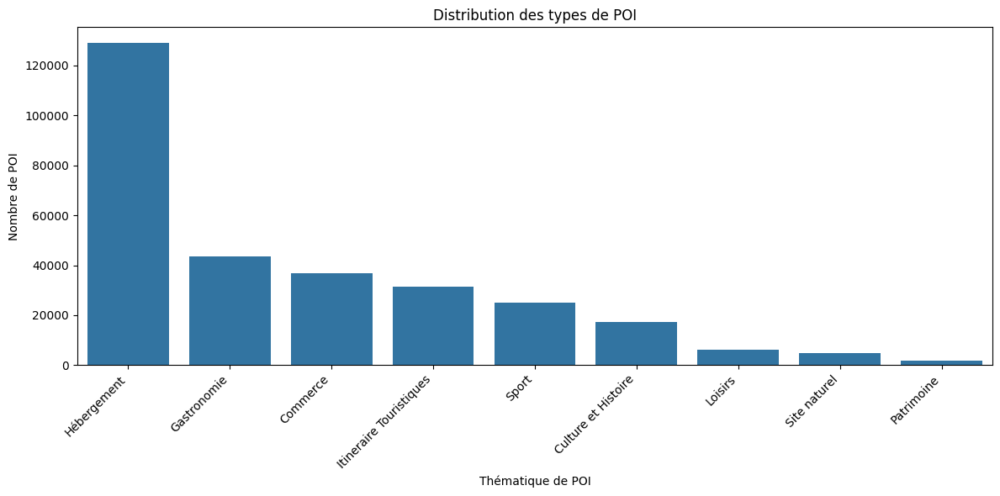

In [4]:

# Create the bar plot
plt.figure(figsize=(12, 6))  # Adjust figure size as needed
sns.countplot(x='Thematique_POI', data=df_final, order=df_final['Thematique_POI'].value_counts().index)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.title('Distribution des types de POI')
plt.xlabel('Thématique de POI')
plt.ylabel('Nombre de POI')
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

In [13]:
import pandas as pd
import plotly.express as px

# Charger les données
df_final = pd.read_csv('datatourism_final.csv')

# Vérifier si la colonne 'Thematique_POI' est présente
if 'Thematique_POI' not in df_final.columns:
    raise ValueError("La colonne 'Thematique_POI' doit être présente dans le DataFrame.")

# Compter les occurrences de chaque thématique
theme_counts = df_final['Thematique_POI'].value_counts().reset_index()
theme_counts.columns = ['Thématique', 'Nombre']

# Créer une représentation circulaire avec Plotly
fig = px.pie(
    theme_counts,
    names='Thématique',
    values='Nombre',
    title="Répartition des Thématiques de POI",
    color_discrete_sequence=px.colors.sequential.RdBu  # Palette de couleurs
)

# Ajouter des personnalisations
fig.update_traces(textinfo='percent+label', pull=[0.1 if i == theme_counts['Nombre'].idxmax() else 0 for i in range(len(theme_counts))])
fig.update_layout(
    title_font_size=18,
    legend_title="Thématique",
    height=600,
    width=800
)

# Afficher le graphique
fig.show()


<ipython-input-13-3719fabc3e21>:5: DtypeWarning:

Columns (11,13) have mixed types. Specify dtype option on import or set low_memory=False.



# Répartition des types de POI par **départements**

In [14]:
import pandas as pd
import plotly.express as px

# Charger les données
df_final = pd.read_csv('datatourism_final.csv')

# Vérifier si la colonne 'nom_departement' est présente
if 'nom_departement' not in df_final.columns or 'Thematique_POI' not in df_final.columns:
    raise ValueError("Les colonnes 'nom_departement' et 'Thematique_POI' doivent être présentes dans le DataFrame.")

# Regrouper les POIs par département et thématique
poi_by_department = df_final.groupby(['nom_departement', 'Thematique_POI']).size().reset_index(name='Nombre_de_POI')

# Créer une représentation Plotly
fig = px.bar(
    poi_by_department,
    x='nom_departement',
    y='Nombre_de_POI',
    color='Thematique_POI',
    title="Répartition des types de POI par département",
    labels={'nom_departement': 'Département', 'Nombre_de_POI': 'Nombre de POIs', 'Thematique_POI': 'Thématique'},
    text='Nombre_de_POI'
)

# Personnaliser l'apparence
fig.update_layout(
    xaxis_title="Département",
    yaxis_title="Nombre de POIs",
    barmode='stack',  # Empilement des barres
    xaxis={'categoryorder': 'total descending'},  # Trier par nombre total de POIs
    legend_title="Thématique de POI",
    height=800,
    width=1200
)

# Afficher la figure
fig.show()


<ipython-input-14-d006efc5455e>:5: DtypeWarning:

Columns (11,13) have mixed types. Specify dtype option on import or set low_memory=False.



In [8]:
import pandas as pd
import plotly.express as px

# Supposons que votre DataFrame s'appelle df
# Comptons le nombre de POIs par département
df_aggregated = df_final.groupby('nom_departement')['Nom_du_POI'].count().reset_index()
df_aggregated.columns = ['Département', 'Nombre de POIs']  # Renommage des colonnes

# Création du graphique interactif
fig = px.bar(df_aggregated,
             x='Département',
             y='Nombre de POIs',
             title="Nombre de POIs par Département",
             labels={'Département': 'Nom du Département', 'Nombre de POIs': 'Nombre de POIs'},
             color='Département',  # On peut colorer par département pour mieux les distinguer
             text='Nombre de POIs')  # Afficher le nombre de POIs sur les barres

# Amélioration de l'interaction
fig.update_traces(texttemplate='%{text}', textposition='outside', hoverinfo='y+text')
fig.update_layout(
    hovermode='closest',
    xaxis_tickangle=-45,  # Rotation de l'axe des X pour améliorer la lisibilité
    showlegend=False
)

# Affichage du graphique
fig.show()


In [ ]:
!pip install geopy

In [ ]:
top_departments = df_final['nom_departement'].value_counts().head(10)
print(top_departments)


nom_departement
Bouches-du-Rhône        33598
Dordogne                13509
Pyrénées-Atlantiques    12648
Gironde                  9230
Bas-Rhin                 7865
Landes                   7202
Hérault                  7082
Jura                     6204
Aveyron                  5927
Haut-Rhin                5711
Name: count, dtype: int64


In [ ]:
top_thematiques = df_final['Thematique_POI'].value_counts().head(10)
print(top_thematiques)


Thematique_POI
Hébergement                128934
Gastronomie                 43570
Commerce                    36698
Itineraire Touristiques     31381
Sport                       24880
Culture et Histoire         17213
Loisirs                      6079
Site naturel                 4685
Patrimoine                   1816
Name: count, dtype: int64


In [ ]:
top_visited_poi = df_final[['Nom_du_POI', 'Nbre_visite']].sort_values(by='Nbre_visite', ascending=False).head(10)
print(top_visited_poi)


                                           Nom_du_POI  Nbre_visite
247238                         Auberge de la Tannerie    1377976.0
275811         La chèvrerie de la Grange des Bruyères    1377976.0
288826                       Bibliothèque de Benassay    1377976.0
237498                              Gîte de la Châtre    1377976.0
169424         La chèvrerie de la Grange des Bruyères    1377976.0
169423         La chèvrerie de la Grange des Bruyères    1377976.0
235062  Aire de Services de Camping-Car de Lavausseau    1377976.0
169425                            Jardin de la Chatre    1377976.0
169426                            Jardin de la Chatre    1377976.0
169428                            Jardin de la Chatre    1377976.0


# Carte de Densite des POIs en **France**

In [15]:
import pandas as pd
import plotly.express as px

# Charger les données
df_final = pd.read_csv('datatourism_final.csv')

# Vérifier les colonnes nécessaires
if not {'Latitude', 'Longitude'}.issubset(df_final.columns):
    raise ValueError("Les colonnes Latitude et Longitude sont nécessaires pour générer la carte.")

# Filtrer les données manquantes
df_filtered = df_final.dropna(subset=['Latitude', 'Longitude'])

# Créer une carte de densité avec Plotly Express
fig = px.density_mapbox(
    df_filtered,
    lat='Latitude',
    lon='Longitude',
    radius=10,  # Ajuster le rayon pour la densité
    center=dict(lat=46.603354, lon=1.888334),  # Centre sur la France
    zoom=5,  # Niveau de zoom initial
    mapbox_style="carto-positron",  # Style de la carte
    title="Densité des POIs en France"
)

# Afficher la carte
fig.show()


<ipython-input-15-83b1964150d9>:5: DtypeWarning:

Columns (11,13) have mixed types. Specify dtype option on import or set low_memory=False.



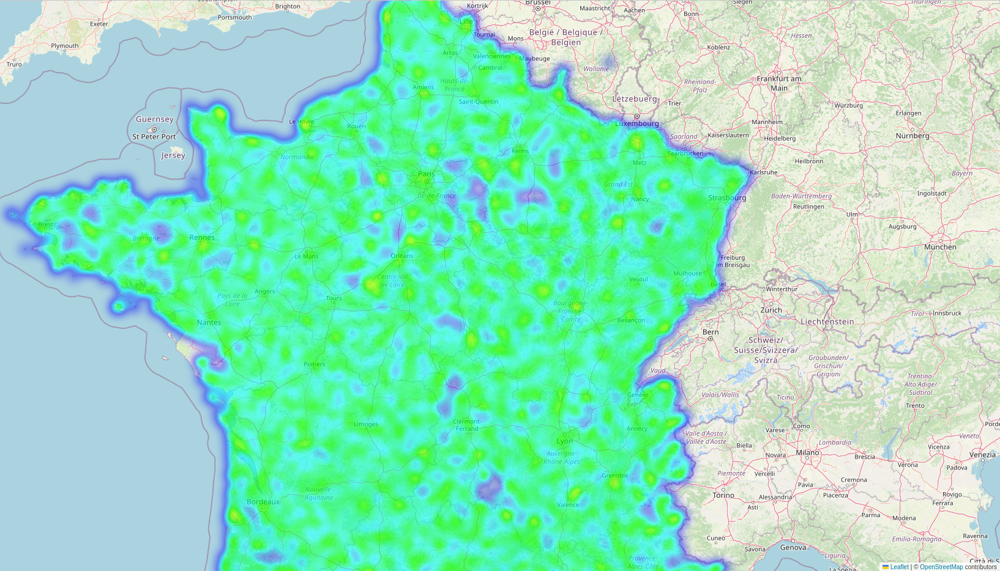

# **Carte de densité du nombre touriste en France**

In [ ]:
pip install plotly pandas


In [16]:
import pandas as pd
import plotly.express as px

# Charger les données
df_final = pd.read_csv('datatourism_final.csv')

# Vérifier les colonnes nécessaires
if not {'Latitude', 'Longitude', 'Nbre_visite'}.issubset(df_final.columns):
    raise ValueError("Les colonnes Latitude, Longitude et Nbre_visite sont nécessaires pour générer la carte.")

# Filtrer les données manquantes
df_filtered = df_final.dropna(subset=['Latitude', 'Longitude', 'Nbre_visite'])

# Créer une carte de densité avec Plotly Express
fig = px.density_mapbox(
    df_filtered,
    lat='Latitude',
    lon='Longitude',
    z='Nbre_visite',
    radius=10,  # Ajuster le rayon pour la densité
    center=dict(lat=46.603354, lon=1.888334),  # Centre sur la France
    zoom=5,  # Niveau de zoom initial
    mapbox_style="carto-positron",  # Style de carte
    title="Densité du nombre de touristes en France"
)

# Afficher la carte
fig.show()


<ipython-input-16-9a8640b400d0>:5: DtypeWarning:

Columns (11,13) have mixed types. Specify dtype option on import or set low_memory=False.



# **Comparaison des POIs par Département**

In [10]:
!pip install Dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 19.4 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: Flask
    Found existing installation: Flask 3.1.0
    Uninstalling Flask-3.1.0:
      Successfully uninstalled Flask-3.1.0


In [12]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Création de l'application Dash
app = dash.Dash(__name__)

# Supposons que votre DataFrame s'appelle df
# Agrégation des données par département
df_aggregated = df_final.groupby('nom_departement')['Nom_du_POI'].count().reset_index()
df_aggregated.columns = ['Département', 'Nombre de POIs']

# Liste des départements disponibles
departements = df_aggregated['Département'].unique()

# Layout de l'application Dash
app.layout = html.Div([
    html.H1("Comparaison des POIs par Département"),

    # Sélection des départements
    html.Label("Sélectionnez deux départements:"),
    dcc.Dropdown(
        id='departement-dropdown',
        options=[{'label': dept, 'value': dept} for dept in departements],
        value=[departements[0], departements[1]],  # Valeurs initiales
        multi=True,  # Permet de sélectionner plusieurs départements
        style={'width': '50%'}
    ),

    # Graphique comparatif
    dcc.Graph(id='comparaison-pois')
])

# Callback pour mettre à jour le graphique en fonction de la sélection des départements
@app.callback(
    Output('comparaison-pois', 'figure'),
    Input('departement-dropdown', 'value')
)
def update_graph(selected_departments):
    # Filtrer le DataFrame en fonction des départements sélectionnés
    filtered_df = df_aggregated[df_aggregated['Département'].isin(selected_departments)]

    # Créer un graphique à barres
    fig = px.bar(filtered_df,
                 x='Département',
                 y='Nombre de POIs',
                 title="Comparaison du Nombre de POIs par Département",
                 labels={'Département': 'Nom du Département', 'Nombre de POIs': 'Nombre de POIs'},
                 color='Département',
                 text='Nombre de POIs')  # Affichage du nombre de POIs sur chaque barre

    # Personnalisation du graphique
    fig.update_traces(texttemplate='%{text}', textposition='outside', hoverinfo='y+text')
    fig.update_layout(
        hovermode='closest',
        xaxis_tickangle=-45,  # Rotation de l'axe des X pour améliorer la lisibilité
        showlegend=False
    )

    return fig

# Lancer l'application Dash
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>